In [1]:
from blender_tissue_cartography import io as tcio
from blender_tissue_cartography import interpolation as tcinterp
from importlib import reload

In [2]:
import numpy as np
from skimage import transform
import os
import matplotlib.pyplot as plt
import mcubes
import pymeshlab

Unable to load the following plugins:

	libio_e57.so: libio_e57.so does not seem to be a Qt Plugin.

Cannot load library /home/nikolas/Programs/miniconda3/envs/blender-tissue-cartography/lib/python3.11/site-packages/pymeshlab/lib/plugins/libio_e57.so: (/lib/x86_64-linux-gnu/libp11-kit.so.0: undefined symbol: ffi_type_pointer, version LIBFFI_BASE_7.0)



## Tissue cartography for a non-trivial topology

In notebook 2, we used tissue cartography on a very simple surface - a mildly curved plane. Here, we'll look at how we can deal with a more complicated surface - that of the gastrulating _Drosophila_ embryo. This is an ellipsoidal surface and will therefore require **seams** in order to map it to the plane.

## Load and subsample data for segmentation

**Data description** _in toto_ light sheet recording of gastrulating _Drosophila_ embryo with membrane marker CAAX-mCherry.

We begin by creating a directory for our project where we'll save all related files. Let's load the dataset. We then enter the relevant metadata - the filename, resolution in microns, and how much we want to subsample for segmentation purposes.

In [3]:
metadata_dict = {'filename': 'drosophila_example/Drosophila_CAAX-mCherry',
                 'resolution_in_microns': (1.05, 1.05, 1.05), # lightsheet data has isotropic resolution
                 'subsampling_factors': (1/2, 1/2, 1/2)}

In [4]:
image = tcio.adjust_axis_order(tcio.imread(f"{metadata_dict['filename']}.tif"))
print("image shape:", image.shape) # image shape - spatial axes are in z-x-y order

image shape: (1, 190, 509, 188)


In [5]:
subsampled_image = transform.rescale(image, metadata_dict['subsampling_factors'],
                                     channel_axis=0, preserve_range=True)
print("subsampled image shape:", subsampled_image.shape)

subsampled image shape: (1, 95, 254, 94)


## Create 3d segmentation

Now create a 3d segmentation, in this case using ilatik. We use [ilastik binary pixel classification](https://www.ilastik.org/documentation/pixelclassification/pixelclassification). We could post-process the ilastik output here, for example using morphsnakes. We then load the segmentation back into the jupyter notebook.

The bright dots outside the embryo are fluorescent beads necessary for sample registration in lightsheet microscopy. You can ignore them.

Attention: when importing the `.h5` into ilastik, make sure the dimension order is correct! In this case, `czyx` for both export and import.

In [6]:
# we now save the subsampled image a .h5 file for input into ilastik for segmentation

tcio.write_h5(f"{metadata_dict['filename']}_subsampled.h5", subsampled_image)

In [7]:
# after creating an ilastik project, training the model, and exporting the probabilities, we load the segmentation

segmentation = tcio.read_h5(f"{metadata_dict['filename']}_subsampled-image_Probabilities.h5")
segmentation = segmentation[0] # select the first channel of the segmentation - it's the probablity a pixel
                               # is part of the sample
print("segmentation shape:", segmentation.shape)

segmentation shape: (95, 254, 94)


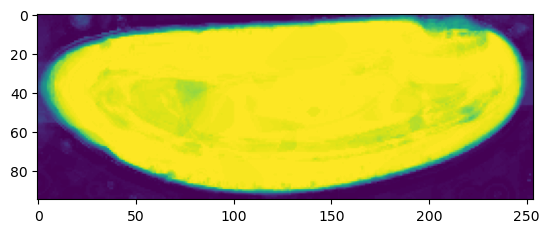

In [8]:
# look at the segmentation in a cross section

plt.imshow(segmentation[:,:,50], vmin=0, vmax=1)

## Meshing

We convert the segmentation into a triangular mesh using the marching cubes method, and save the mesh. We save all meshes in as wavefront `.obj` files (see [wikipedia](https://en.wikipedia.org/wiki/Wavefront_.obj_file)). In python, we represent missing entries (such as a vertex which doesn't have a normal by `np.nan`.

**Important convention** For sanities sake, we will always store all mesh coordinates in microns. This means rescaling appropriately after calculating the mesh from the 3d segmentation.

In [9]:
# now we create a 3d mesh of using the marching cubes method

level_set = mcubes.smooth(segmentation, method="gaussian") # converts segmentation into level set, with 0=surface
vertices, faces = mcubes.marching_cubes(level_set, 0)

# EXTREMELY IMPORTANT - we now rescale the vertex coordinates so that they are in microns.
vertices_in_microns = vertices * (np.array(metadata_dict['resolution_in_microns'])
                                 /np.array(metadata_dict['subsampling_factors']))

In [12]:
mesh = tcio.ObjMesh(vertices_in_microns, faces)
mesh.name = "Drosophila_CAAX-mCherry_mesh_marching_cubes"
mesh.write_obj(f"{metadata_dict['filename']}_mesh_marching_cubes.obj")

### Optional - improve mesh quality using MeshLab

We can remesh the output of the marching cubes algorithm to obtain an improved mesh, i.e. with more uniform triangle shapes. In this example, we first remesh to make the mesh more uniform.
You can also try this out in the MeshLab GUI and export your workflow as a python script. Be careful not to move the mesh or it will mess up the correspondence with the pixel coordinates!

See [List of MeshLab filers](https://pymeshlab.readthedocs.io/en/latest/filter_list.html)

In [13]:
ms = pymeshlab.MeshSet()
ms.load_new_mesh(f"{metadata_dict['filename']}_mesh_marching_cubes.obj")
ms.meshing_isotropic_explicit_remeshing()
ms.save_current_mesh(f"{metadata_dict['filename']}_mesh_remeshed.obj")

To check all went well, let's overlay the mesh coordinates over a cross section of the image. To do so, we first select the vertices whose positions correspond to the image slice, and then correctly rescale coordinates from microns to pixel coordinates.

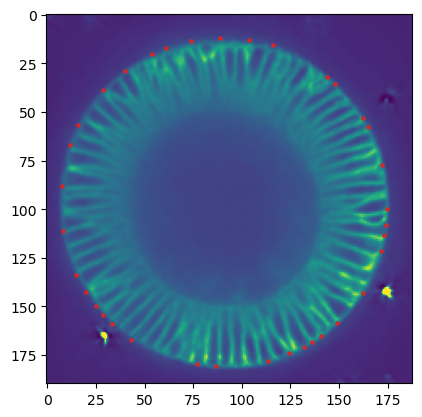

In [14]:
image = tcio.adjust_axis_order(tcio.imread(f"{metadata_dict['filename']}.tif"))
vertices = tcio.ObjMesh.read_obj(f"{metadata_dict['filename']}_mesh_remeshed.obj").vertices

slize_index = 200
slice_coordinate = slize_index*metadata_dict["resolution_in_microns"][1]
slize_vertices = vertices[np.abs(vertices[:,1]-slice_coordinate) < 1]
plt.scatter(slize_vertices[:,2]/metadata_dict["resolution_in_microns"][2],
            slize_vertices[:,0]/metadata_dict["resolution_in_microns"][0], s=5, c="tab:red")

plt.imshow(image[0,:,slize_index,:], aspect=(metadata_dict["resolution_in_microns"][0]
                                     /metadata_dict["resolution_in_microns"][1]), vmax=10000)

## Brocessing in blender

We now switch to blender and create a new empty project, which we will call `f"{metadata_dict['filename']}.blend"`. We import the mesh just generated (File->Import).

I recommend using the "object" tab (orange square on right toolbar) to lock mesh position and rotation so we don't accidentally move it.

### Mesh editing

The mesh we have created unfortunately contains a few holes, where the segmentation surface touched the image boundary:

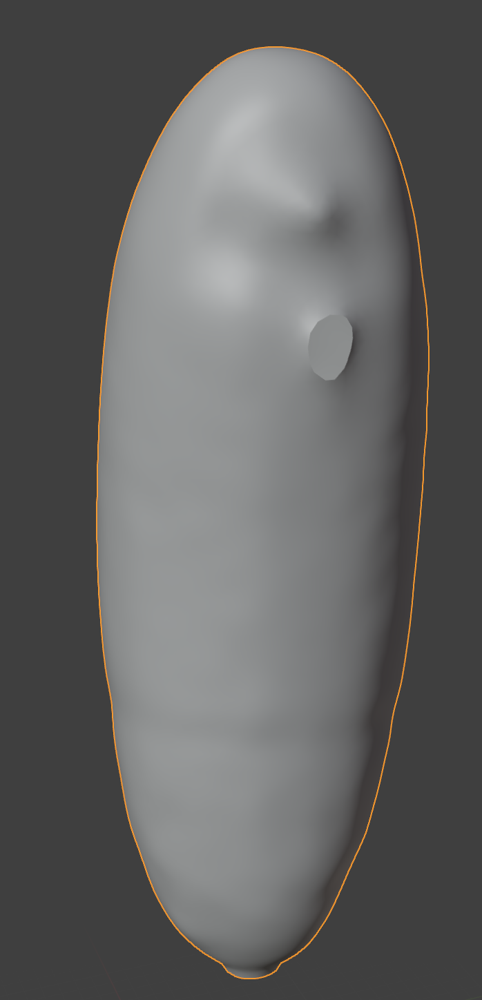

Useful shortcuts: "A" selects all and "." on the numpad centers the view on the currently selected element.

Let's fix them using blender's mesh editing tools. Go to the "Modeling" workspace on the top toolbar. Press "2" to got to edge mode, select the loop around the whole and then use "Faces->fill" to fill the hole.

We can also use the "Mesh->fill holes tool". Afterwards, we can smooth out our mesh in the "Sculpting" tab, for instance using the "Smooth" tool. This is the result:

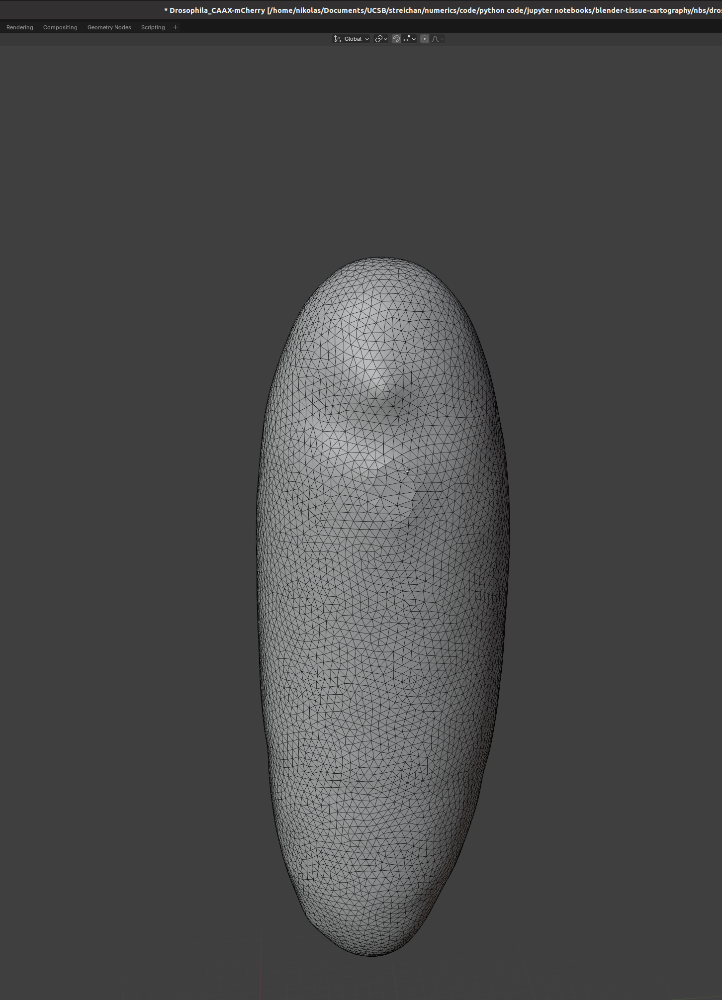

Not super beautiful but this is for illustration purposes only.



### UV mapping

Let's try to move forward and get a UV map of the mesh. To do so, we go to the "UV Editing" tab on the top toolbar, press "3" then "A" to select all faces ("1" selects vertices, "2" edges, and "3" faces). Click "UV->sphere projection" on the top panel to get an automated, default UV map:

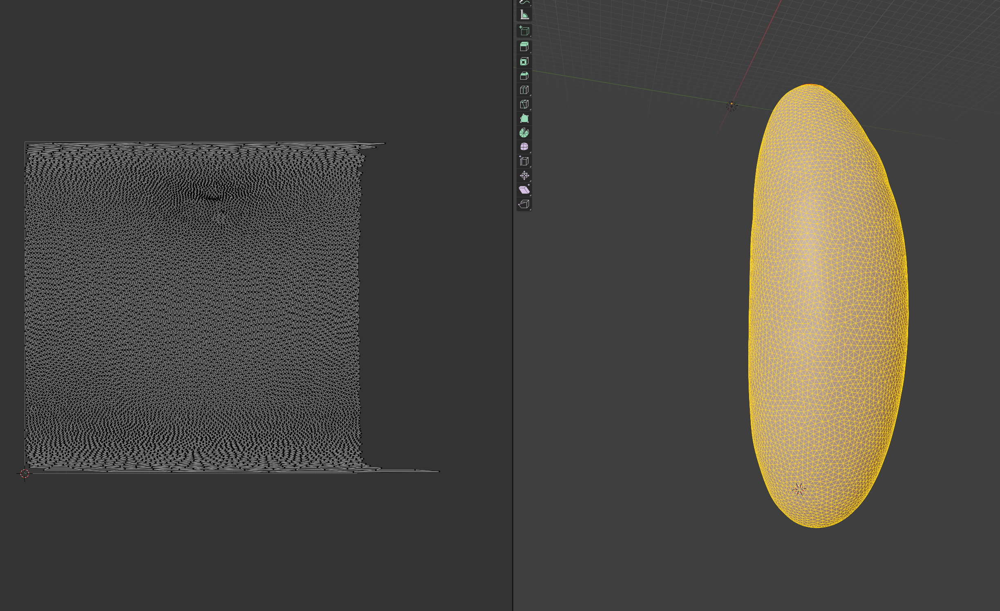

#### Defining seams

Since our surface is not topologically equivalent to the cartographic UV square, we need to define seams along which to cut. Blender makes some choice automatically, but it might not be what we want.

Press "2" to go into edge selection mode, select a loop along which you want to cut, right click, and select "Mark seam". We'll do this on the anterior and posterior pole of the embryo, as well as along the dorsal midline.

For the dorsal seam, it's easiest to specify it by selecting two vertices and finding the shortest path between them. Press "1" for vertex mode, "right click" on the initial vertex, hold "ctrl" and "left click" on the final vertex, then press "2" to switch back to edge mode. Our seams now look like this:

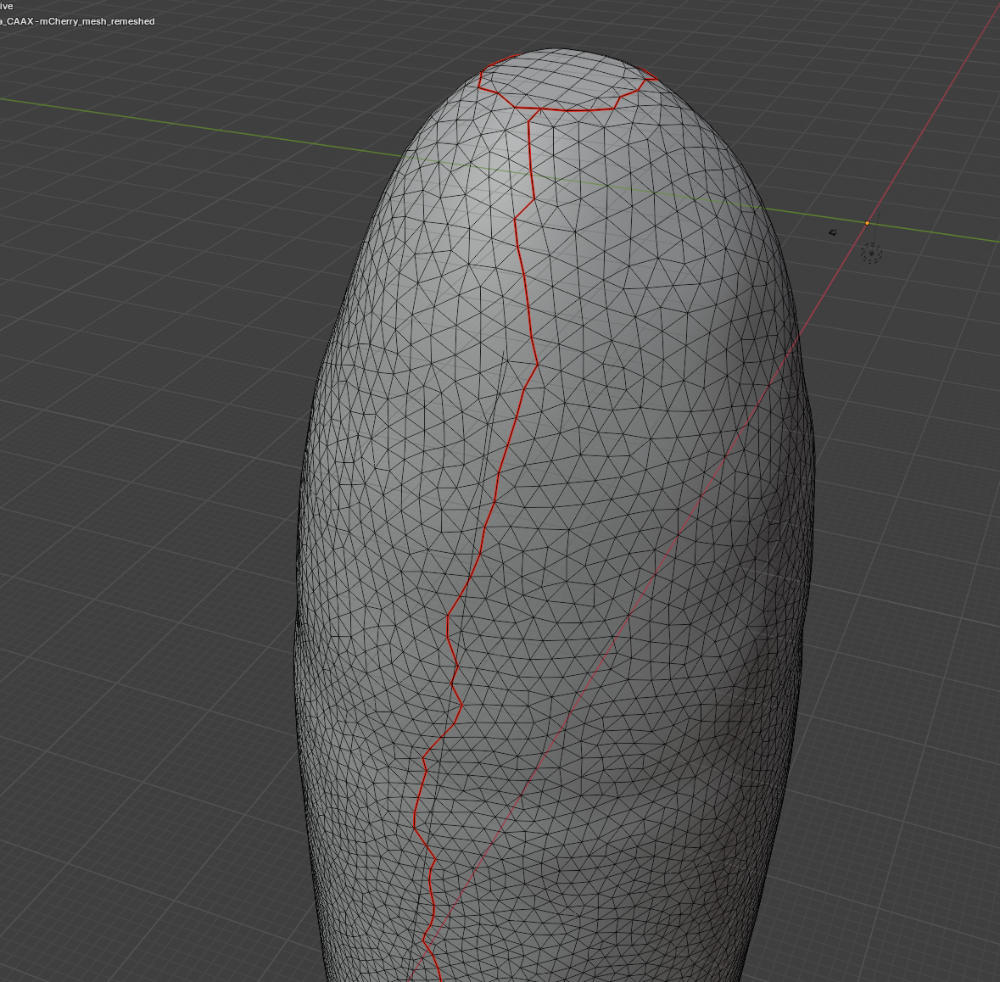

Now we can click "UV-> unwrap" and get an unwrapping with our desired seams!

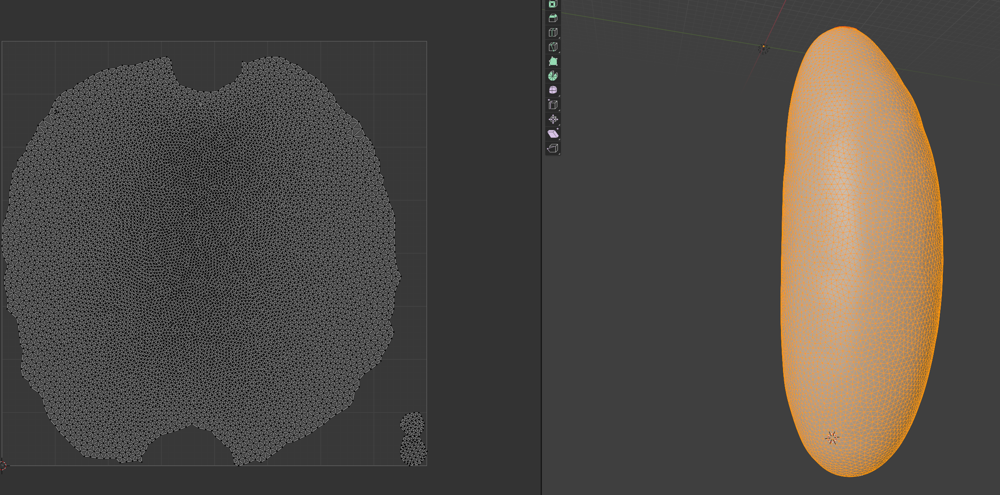

By default, blender will make a projection that tries to preserve areas. The two little caps in the bottom are our poles. To move stuff around in the UV map, select the objects of interest, press "g" to move, and "click" to confirm the new position. Try it by moving the pole caps a little away from one another.

There are various tools for editing UV maps 

Once we are happy with or UV map, we click on export and save as `.obj` with UV and normals. The new mesh file `f"{metadata_dict['filename']}_mesh_uv.obj"` now contains vertex normals and UV coordinates as `vn` and `vt` lines. Note - there can be more `vt`'s than `v`'s.

### Cartographic projection/interpolation onto UV grid

We now read in the new `.obj` file in order to interpolate the image data onto the 3d mesh. The UV grid always covers the unit square $[0,1]^2$.

We additionally specify a series of offsets in the normal direction to make a multilayer projection. We also get the 3d coordinates and the vertex normals interpolated onto the UV grid from this step.

In [4]:
normal_offsets = np.linspace(-2, 2, 5) # in microns
metadata_dict["normal_offsets"] = normal_offsets # add the info to the metadata
uv_grid_steps = 512

In [5]:
projected_data, projected_coordinates, projected_normals = tcinterp.create_cartographic_projections(
    image=f"{metadata_dict['filename']}.tif",
    mesh=f"{metadata_dict['filename']}_mesh_uv.obj",
    resolution=metadata_dict["resolution_in_microns"],
    normal_offsets=normal_offsets,
    uv_grid_steps=uv_grid_steps)

In [6]:
# save images for visualization in blender
texture_path = f"{os.getcwd()}/{metadata_dict['filename']}_textures"
tcio.save_stack_for_blender(projected_data, texture_path, normalization=(0.01, 0.99))

In [7]:
# save images as .tif stack for analysis
tcio.save_for_imageJ(f"{metadata_dict['filename']}_projected.tif", projected_data, z_axis=1)
tcio.save_for_imageJ(f"{metadata_dict['filename']}_3d_coordinates.tif", projected_coordinates)
tcio.save_for_imageJ(f"{metadata_dict['filename']}_normals.tif", projected_normals)

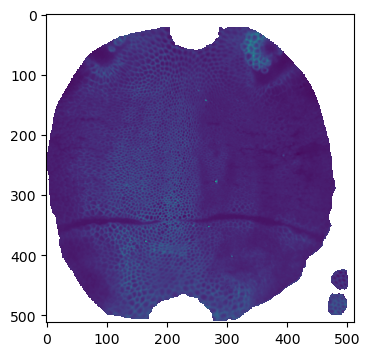

In [8]:
# show the projected data

fig = plt.figure(figsize=(4,4))
plt.imshow(projected_data[0, 1])

<matplotlib.image.AxesImage>

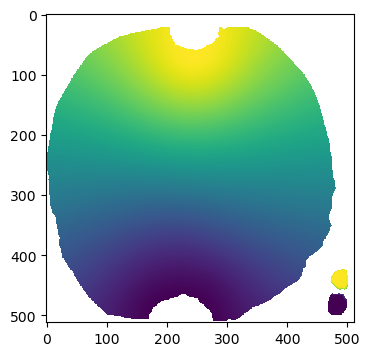

In [ ]:
# show the projected 3d coordinates

fig = plt.figure(figsize=(4,4))
plt.imshow(projected_coordinates[...,1])

### Visualization 

As in the previous example, we now use blender's shading tools to show the projections as textures on our 3d mesh. But let's go a step further and add a shader that gives a better appreciation of depth/3d-ness.

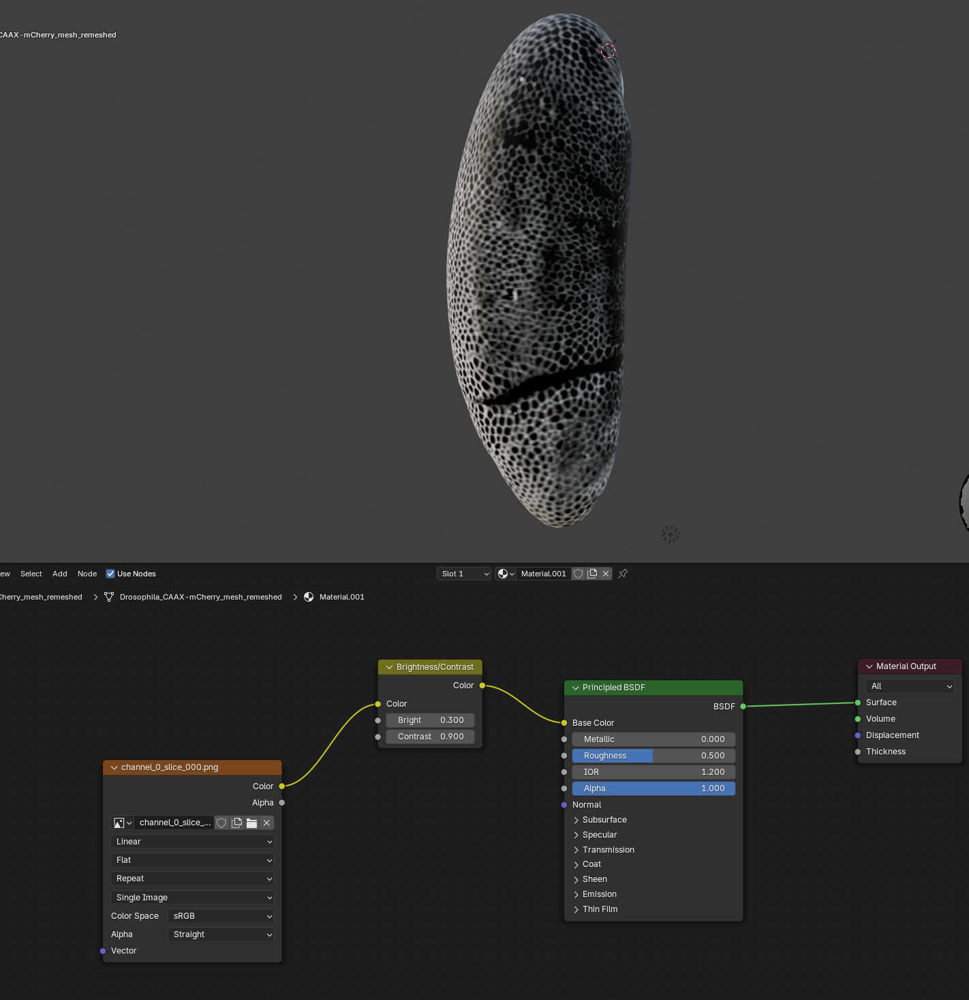